In [178]:
%matplotlib inline
from matplotlib import pyplot as plt, cm
import matplotlib.patches as mpatches
import skimage
from skimage.io import imread
from skimage import exposure
from skimage.transform import rotate
from skimage import morphology
from skimage import data, segmentation, filters, color
from skimage.util import img_as_ubyte
from skimage import img_as_float
from skimage import data
from skimage import io, segmentation as seg, color
from skimage import feature
from skimage import color
from skimage.morphology import watershed
from skimage.measure import regionprops
from skimage.filters import threshold_otsu
from skimage.filters import threshold_adaptive
from skimage.feature import corner_harris, corner_peaks
from skimage.filters import hsobel,vsobel
from skimage import measure
from skimage.transform import hough_circle
from skimage.feature import peak_local_max
from skimage.color import gray2rgb
from skimage.draw import circle_perimeter
from skimage.feature import ORB, match_descriptors
from skimage.transform import ProjectiveTransform
from skimage.measure import ransac
from skimage.feature import plot_matches
from skimage.transform import SimilarityTransform
from skimage.exposure import rescale_intensity
from skimage.transform import warp
import skdemo
import numpy as np
from scipy.ndimage import convolve
from scipy.signal import convolve2d
from scipy import ndimage as nd

In [2]:
im = imread("./data/IMG_4158.jpg")

In [3]:
print 'image shape:', im.shape
print 'image (min,max):', im.min(), im.max()

image shape: (2448, 3264, 3)
image (min,max): 0 255


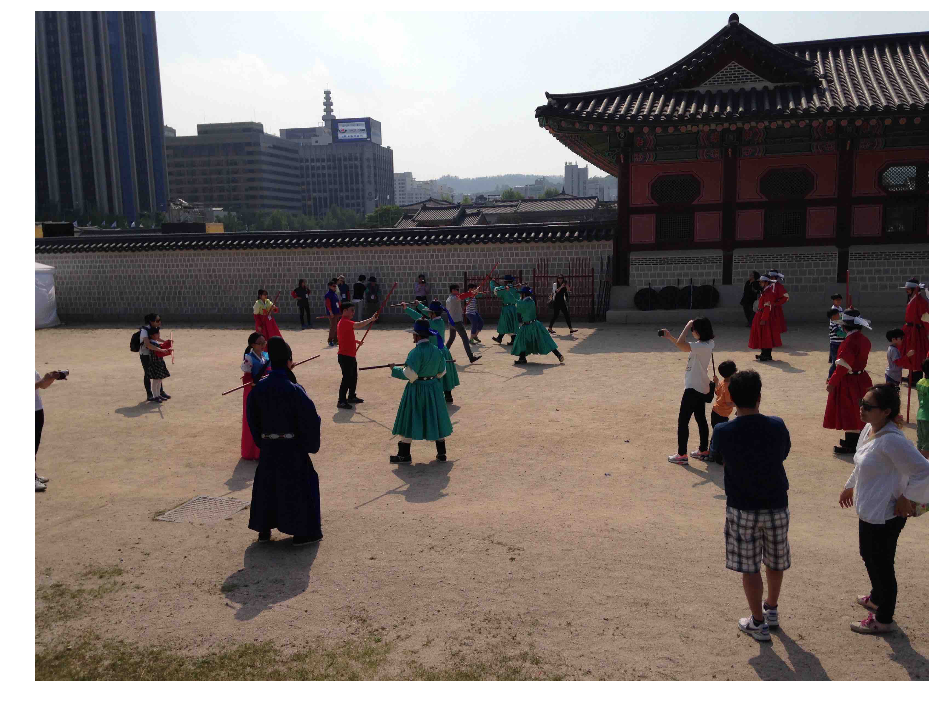

In [4]:
plt.figure(figsize=(16,12))

plt.subplot(1,1,1)
plt.axis('off')
plt.imshow(im)

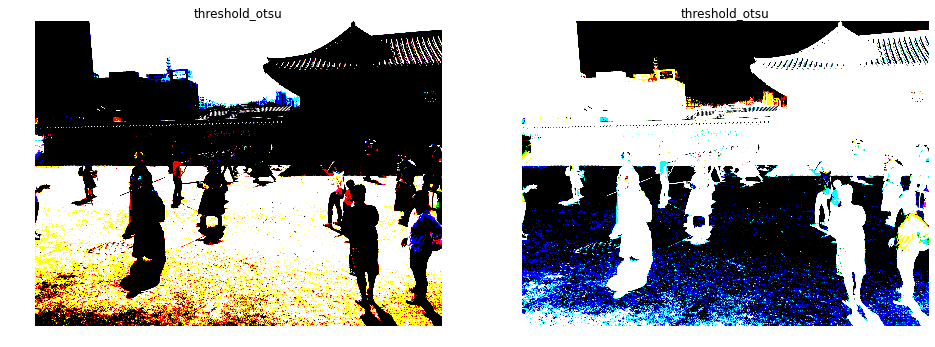

In [5]:
plt.figure(figsize=(16,12))

im = imread("./data/IMG_4158.jpg")

mask1 = im > filters.threshold_otsu(im)
mask2 = im < filters.threshold_otsu(im)

plt.subplot(1,2,1)
plt.axis('off')
plt.title('threshold_otsu')
plt.imshow(mask1)

plt.subplot(1,2,2)
plt.axis('off')
plt.title('threshold_otsu')
plt.imshow(mask2)

plt.show()

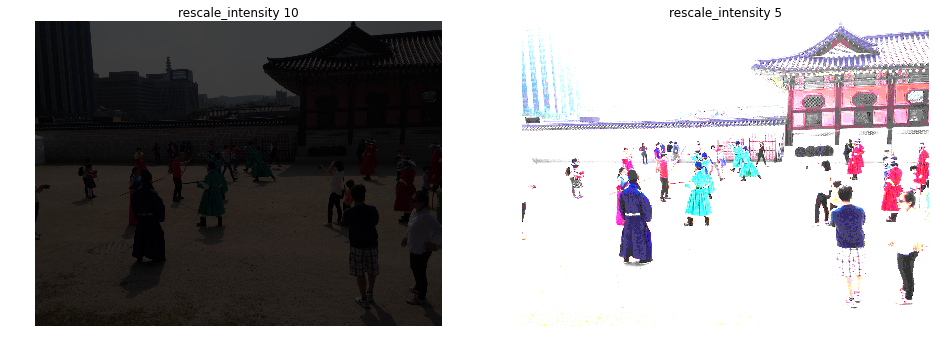

In [6]:
plt.figure(figsize=(16,12))

im = imread("./data/IMG_4158.jpg")
im = img_as_ubyte(im)  # To convert to uint8 data type

image10 = exposure.rescale_intensity(im, in_range=(0, 2**10 - 1))
plt.subplot(1,2,1)
plt.axis('off')
plt.title('rescale_intensity 10')
plt.imshow(image10)

image8 = exposure.rescale_intensity(im, in_range=(0, 2**5 - 1))
plt.subplot(1,2,2)
plt.axis('off')
plt.title('rescale_intensity 5 ')
plt.imshow(image8)

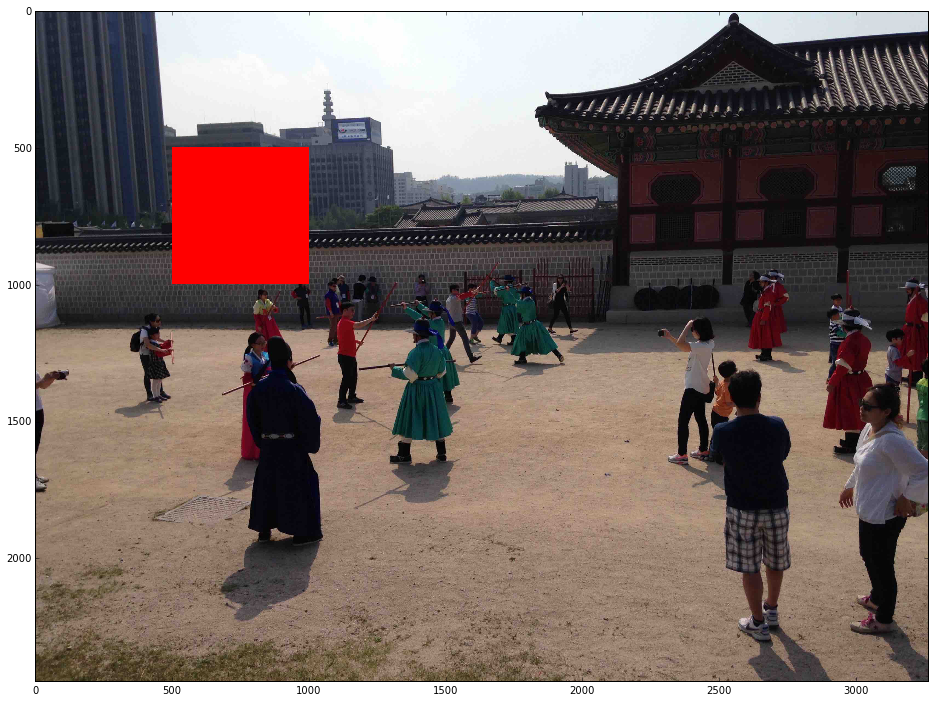

In [7]:
plt.figure(figsize=(16,12))

im = imread("./data/IMG_4158.jpg")

im[500:1000, 500:1000, :] = [255, 0, 0]  # [red, green, blue]
plt.imshow(im)

('Linear0:', dtype('float64'), 0.0, 1.0)
('Linear1:', dtype('uint8'), 0, 255)


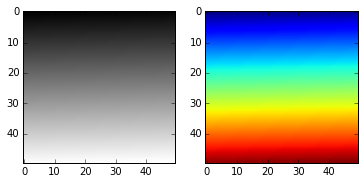

In [8]:
linear0 = np.linspace(0, 1, 2500).reshape((50, 50))
linear1 = np.linspace(0, 255, 2500).reshape((50, 50)).astype(np.uint8)

print("Linear0:", linear0.dtype, linear0.min(), linear0.max())
print("Linear1:", linear1.dtype, linear1.min(), linear1.max())

fig, (ax0, ax1) = plt.subplots(1, 2)
ax0.imshow(linear0, cmap='gray')
ax1.imshow(linear1, cmap='jet')

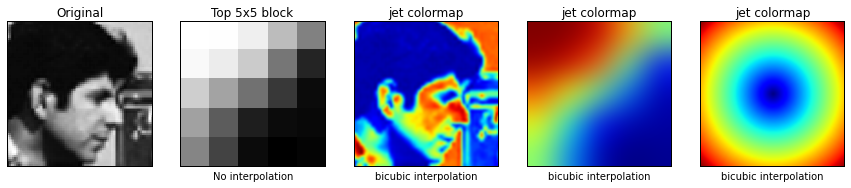

In [9]:
image = data.camera()
face = image[80:160, 200:280]
X, Y = np.ogrid[-5:5:0.1, -5:5:0.1]
R = np.sqrt(X**2 + Y**2)

from IPython.html.widgets import interact, fixed
from matplotlib import cm as colormaps

@interact(image=fixed(face),
          cmap=sorted([c for c in colormaps.datad.keys() if not c.endswith('_r')],
                      key=lambda x: x.lower()),
          interpolation=['nearest', 'bilinear', 'bicubic',
                         'spline16', 'spline36', 'hanning', 'hamming',
                         'hermite', 'kaiser', 'quadric', 'catrom',
                         'gaussian', 'bessel', 'mitchell', 'sinc', 'lanczos'])
def imshow_params(image, cmap='jet', interpolation='bicubic'):
    fig, axes = plt.subplots(1, 5, figsize=(15, 4))
    
    axes[0].imshow(image, cmap='gray', interpolation='nearest')
    axes[0].set_title('Original')
    
    axes[1].imshow(image[:5, :5], cmap='gray', interpolation='nearest')
    axes[1].set_title('Top 5x5 block')
    axes[1].set_xlabel('No interpolation')

    axes[2].imshow(image, cmap=cmap, interpolation=interpolation)
    axes[2].set_title('%s colormap' % cmap)
    axes[2].set_xlabel('%s interpolation' % interpolation)
    
    axes[3].imshow(image[:5, :5], cmap=cmap, interpolation=interpolation)
    axes[3].set_title('%s colormap' % cmap)
    axes[3].set_xlabel('%s interpolation' % interpolation)
    
    axes[4].imshow(R, cmap=cmap, interpolation=interpolation)
    axes[4].set_title('%s colormap' % cmap)
    axes[4].set_xlabel('%s interpolation' % interpolation)
    
    for ax in axes:
        ax.set_xticks([])
        ax.set_yticks([])

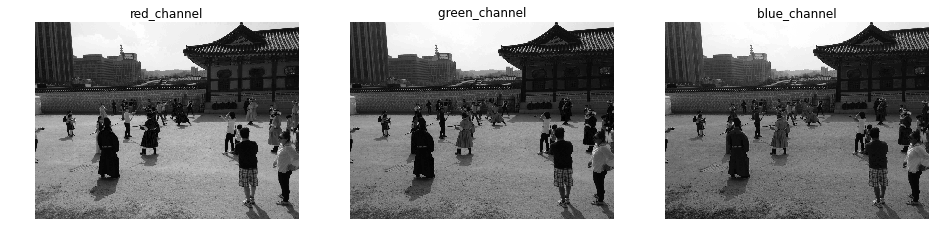

In [12]:
plt.figure(figsize=(16,12))

im = imread("./data/IMG_4158.jpg")

red_channel = im[:, :, 0] 
green_channel = im[:, :, 1] 
blue_channel = im[:, :, 2] 

plt.subplot(1,3,1)
plt.axis('off')
plt.title('red_channel')
plt.imshow(red_channel)

plt.subplot(1,3,2)
plt.axis('off')
plt.title('green_channel ')
plt.imshow(green_channel)

plt.subplot(1,3,3)
plt.axis('off')
plt.title('blue_channel ')
plt.imshow(blue_channel)

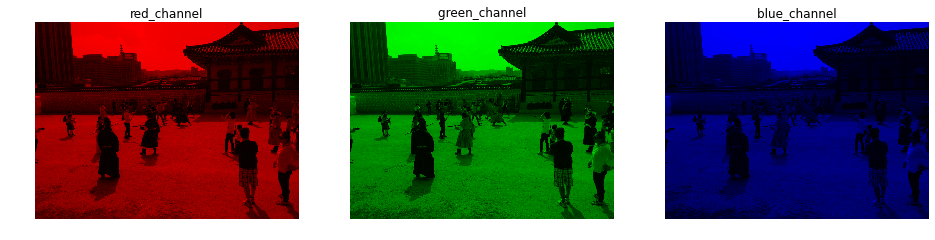

In [13]:
plt.figure(figsize=(16,12))

image = imread("./data/IMG_4158.jpg")

red, green, blue = image.copy(), image.copy(), image.copy()

red[:,:,(1,2)] = 0
green[:,:,(0,2)] = 0
blue[:,:,(0,1)] = 0

plt.subplot(1,3,1)
plt.axis('off')
plt.title('red_channel')
plt.imshow(red)

plt.subplot(1,3,2)
plt.axis('off')
plt.title('green_channel ')
plt.imshow(green)

plt.subplot(1,3,3)
plt.axis('off')
plt.title('blue_channel ')
plt.imshow(blue)

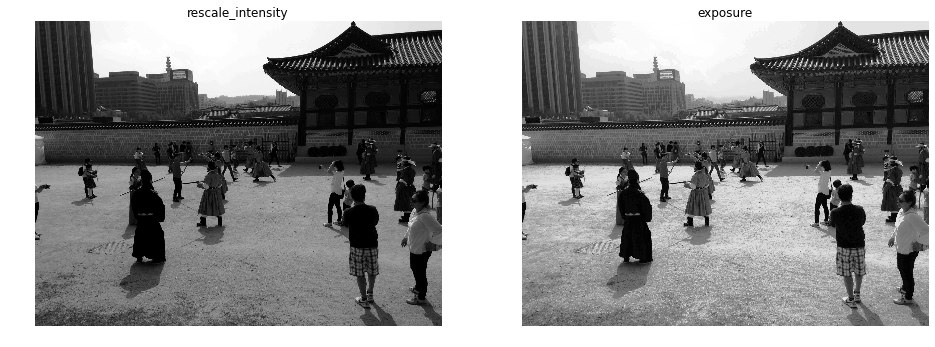

In [14]:
plt.figure(figsize=(16,12))

im = imread("./data/IMG_4158.jpg", as_grey=True)

# Contrast stretching
p2, p98 = np.percentile(im, (2, 98))
img_rescale = exposure.rescale_intensity(im, in_range=(p2, p98))
plt.subplot(1,2,1)
plt.axis('off')
plt.title('rescale_intensity')
plt.imshow(img_rescale)

# Equalization
img_eq = exposure.equalize_hist(im)
plt.subplot(1,2,2)
plt.axis('off')
plt.title('exposure')
plt.imshow(img_eq)

/Users/dikien/anaconda/lib/python2.7/site-packages/skimage/util/dtype.py:107: UserWarning: Possible precision loss when converting from float64 to uint16
  "%s to %s" % (dtypeobj_in, dtypeobj))


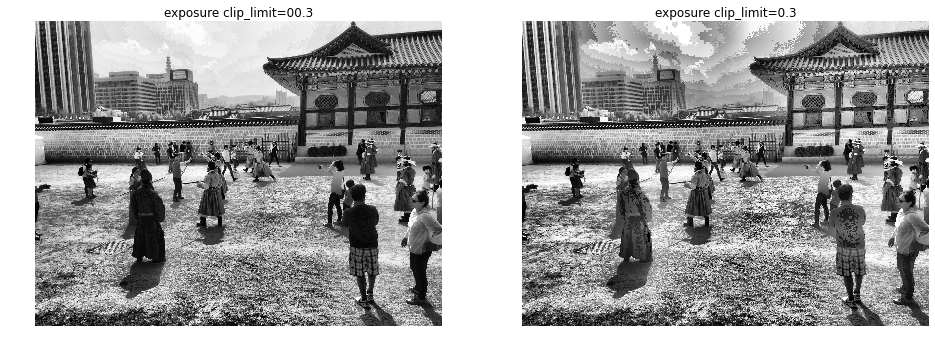

In [15]:
plt.figure(figsize=(16,12))

im = imread("./data/IMG_4158.jpg", as_grey=True)

# Adaptive Equalization
img_adapteq = exposure.equalize_adapthist(im, clip_limit=0.03)
plt.subplot(1,2,1)
plt.axis('off')
plt.title('exposure clip_limit=00.3')
plt.imshow(img_adapteq)

# Adaptive Equalization
img_adapteq = exposure.equalize_adapthist(im, clip_limit=0.3)
plt.subplot(1,2,2)
plt.axis('off')
plt.title('exposure clip_limit=0.3')
plt.imshow(img_adapteq)

(<matplotlib.axes._subplots.AxesSubplot at 0x11a9cf310>,
 <matplotlib.axes._subplots.AxesSubplot at 0x119c31bd0>)

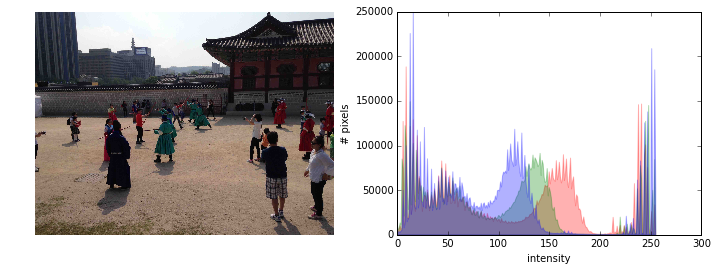

In [16]:
im = imread("./data/IMG_4158.jpg")
skdemo.imshow_with_histogram(im)

/Users/dikien/anaconda/lib/python2.7/site-packages/skimage/exposure/exposure.py:62: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel.
  warnings.warn("This might be a color image. The histogram will be "


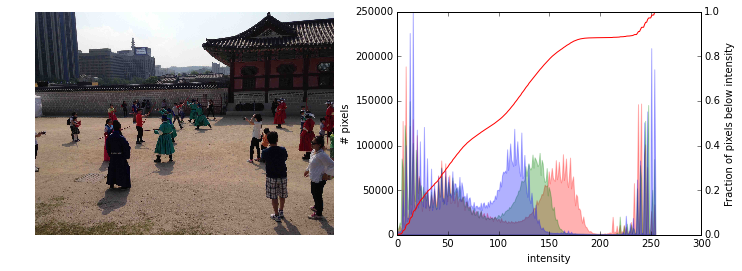

In [17]:
im = imread("./data/IMG_4158.jpg")
ax_image, ax_hist = skdemo.imshow_with_histogram(im)
skdemo.plot_cdf(im, ax=ax_hist.twinx())

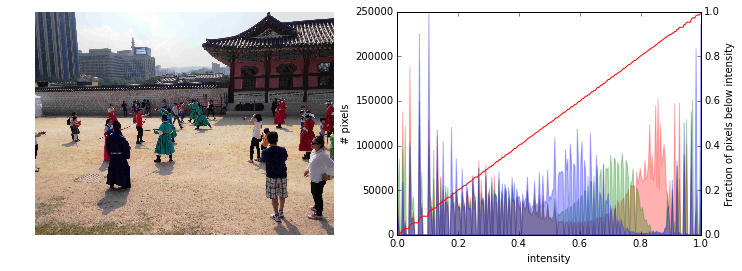

In [18]:
im = imread("./data/IMG_4158.jpg")
equalized = exposure.equalize_hist(im)
ax_image, ax_hist = skdemo.imshow_with_histogram(equalized)
skdemo.plot_cdf(equalized, ax=ax_hist.twinx())

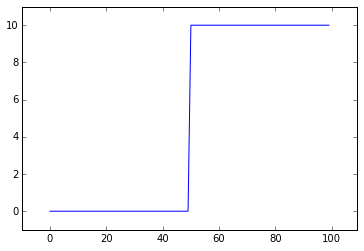

In [19]:
step_signal = np.zeros(100)
step_signal[50:] = 10
plt.plot(step_signal)
plt.margins(0.1)

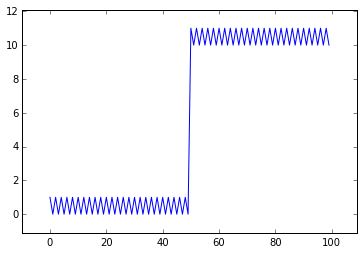

In [20]:
noisy_signal = np.copy(step_signal)
noisy_signal[::2] += 1
plt.plot(noisy_signal)
plt.margins(0.1)

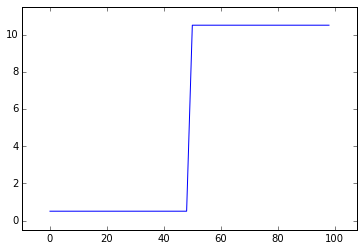

In [21]:
# Take the mean of neighboring pixels
smooth_signal = (noisy_signal[:-1] + noisy_signal[1:]) / 2.0
plt.plot(smooth_signal)
plt.margins(0.1)

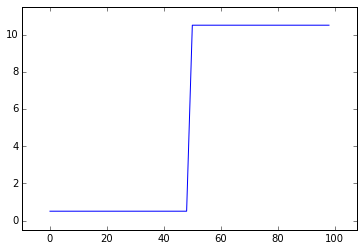

In [22]:
# Same as above, using a convolution kernel
# Neighboring pixels multiplied by 1/2 and summed
mean_kernel = np.array([1, 1]) / 2.0
smooth_signal = np.convolve(noisy_signal, mean_kernel, mode='valid')
plt.plot(smooth_signal)
plt.margins(0.1)

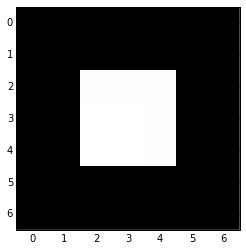

In [23]:
bright_square = np.zeros((7, 7), dtype=float)
bright_square[2:5, 2:5] = 1
plt.imshow(bright_square, interpolation='none')

In [24]:
mean_kernel = 1.0/9.0 * np.ones((3, 3))
print mean_kernel

[[ 0.11111111  0.11111111  0.11111111]
 [ 0.11111111  0.11111111  0.11111111]
 [ 0.11111111  0.11111111  0.11111111]]


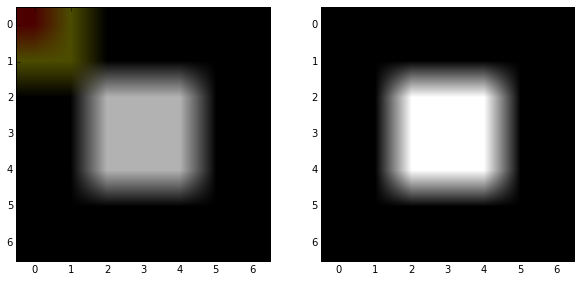

In [25]:
skdemo.mean_filter_interactive_demo(bright_square)

In [26]:
print convolve(bright_square, mean_kernel)
print 
%precision 2
print convolve(bright_square, mean_kernel)

[[ 0.          0.          0.          0.          0.          0.          0.        ]
 [ 0.          0.11111111  0.22222222  0.33333333  0.22222222  0.11111111
   0.        ]
 [ 0.          0.22222222  0.44444444  0.66666667  0.44444444  0.22222222
   0.        ]
 [ 0.          0.33333333  0.66666667  1.          0.66666667  0.33333333
   0.        ]
 [ 0.          0.22222222  0.44444444  0.66666667  0.44444444  0.22222222
   0.        ]
 [ 0.          0.11111111  0.22222222  0.33333333  0.22222222  0.11111111
   0.        ]
 [ 0.          0.          0.          0.          0.          0.          0.        ]]

[[ 0.    0.    0.    0.    0.    0.    0.  ]
 [ 0.    0.11  0.22  0.33  0.22  0.11  0.  ]
 [ 0.    0.22  0.44  0.67  0.44  0.22  0.  ]
 [ 0.    0.33  0.67  1.    0.67  0.33  0.  ]
 [ 0.    0.22  0.44  0.67  0.44  0.22  0.  ]
 [ 0.    0.11  0.22  0.33  0.22  0.11  0.  ]
 [ 0.    0.    0.    0.    0.    0.    0.  ]]


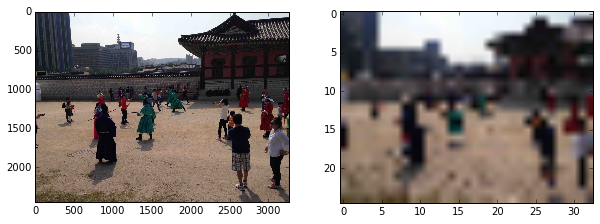

In [27]:
plt.figure(figsize=(16,12))

im = imread("./data/IMG_4158.jpg")
pixelated = im[::100, ::100]
skdemo.imshow_all(im, pixelated)

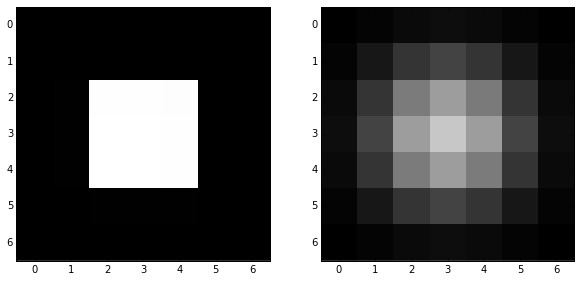

In [28]:
sigma = 1
smooth = filters.gaussian_filter(bright_square, sigma)
skdemo.imshow_all(bright_square, smooth, interpolation='none')

/Users/dikien/anaconda/lib/python2.7/site-packages/skimage/filters/_gaussian.py:94: RuntimeWarning: Images with dimensions (M, N, 3) are interpreted as 2D+RGB by default. Use `multichannel=False` to interpret as 3D image with last dimension of length 3.
  warnings.warn(RuntimeWarning(msg))


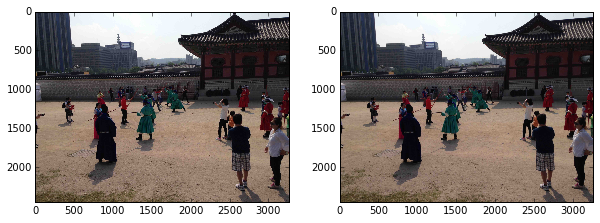

In [29]:
im = imread("./data/IMG_4158.jpg")

# The Gaussian filter returns a float image, regardless of input.
# Cast to float so the images have comparable intensity ranges.
pixelated_float = img_as_float(im)
smooth = filters.gaussian_filter(pixelated_float, 1)
skdemo.imshow_all(pixelated_float, smooth)

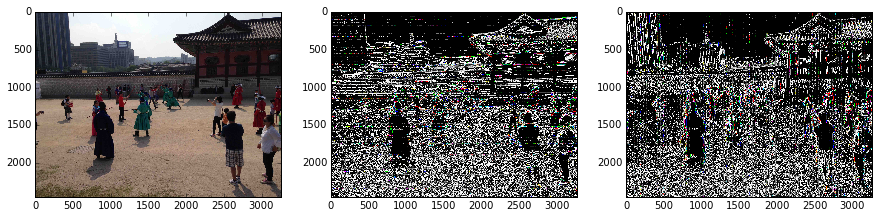

In [30]:
im = imread("./data/IMG_4158.jpg")

vertical_gradient = im[1:, :] - im[:-1, :]
horizontal_gradient = im[:, 1:] - im[:, :-1]

skdemo.imshow_all(im, vertical_gradient, horizontal_gradient)

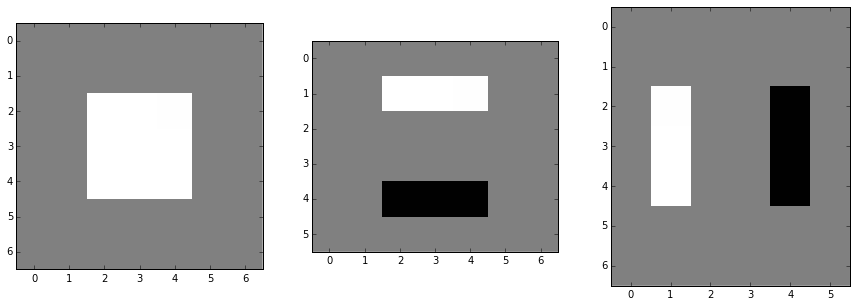

In [31]:
vertical_gradient = bright_square[1:, :] - bright_square[:-1, :]
horizontal_gradient = bright_square[:, 1:] - bright_square[:, :-1]
skdemo.imshow_all(bright_square, vertical_gradient, horizontal_gradient, interpolation='none')

In [32]:
plt.rcParams['image.cmap'] = 'cubehelix'
plt.rcParams['image.interpolation'] = 'none'

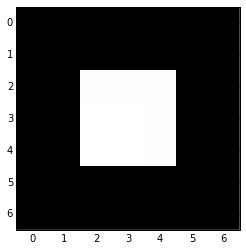

In [33]:
image = np.array([[0, 0, 0, 0, 0, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0],
                  [0, 0, 1, 1, 1, 0, 0],
                  [0, 0, 1, 1, 1, 0, 0],
                  [0, 0, 1, 1, 1, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0]], dtype=np.uint8)
plt.imshow(image)

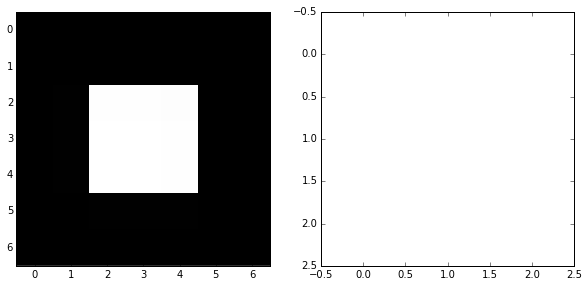

In [34]:
skdemo.imshow_all(image, morphology.square(width=3), shape=(1, 2))

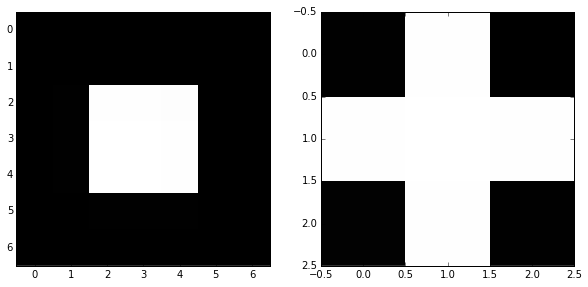

In [35]:
skdemo.imshow_all(image, morphology.diamond(radius=1), shape=(1, 2))

[[1 1 1]
 [1 1 1]
 [1 1 1]]


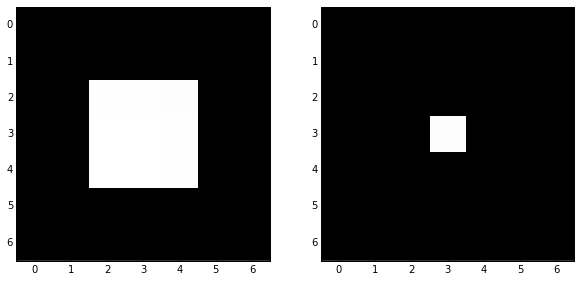

In [36]:
skdemo.imshow_all(image, morphology.erosion(image, morphology.square(width=3)), shape=(1, 2))
print morphology.square(width=3)

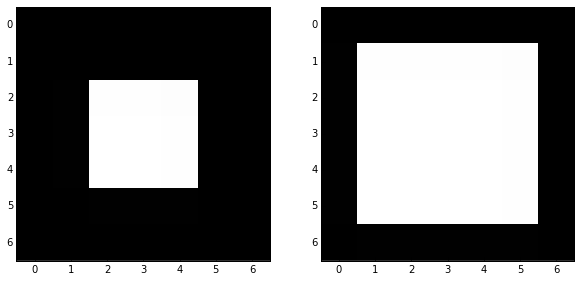

In [37]:
skdemo.imshow_all(image, morphology.dilation(image, morphology.square(width=3)))

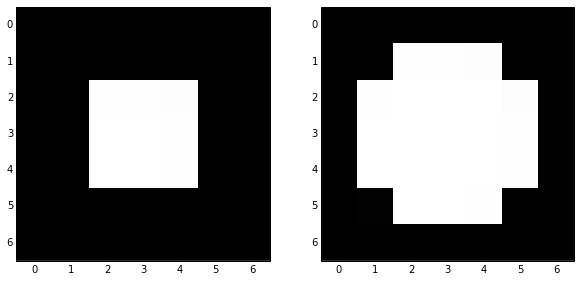

In [38]:
skdemo.imshow_all(image, morphology.dilation(image, morphology.diamond(radius=1)))

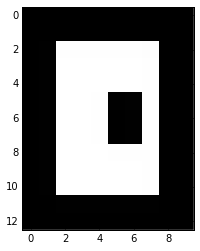

In [39]:
image = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                  [0, 0, 1, 1, 1, 1, 1, 1, 0, 0],
                  [0, 0, 1, 1, 1, 1, 1, 1, 0, 0],
                  [0, 0, 1, 1, 1, 1, 1, 1, 0, 0],
                  [0, 0, 1, 1, 1, 0, 0, 1, 0, 0],
                  [0, 0, 1, 1, 1, 0, 0, 1, 0, 0],
                  [0, 0, 1, 1, 1, 0, 0, 1, 0, 0],
                  [0, 0, 1, 1, 1, 1, 1, 1, 0, 0],
                  [0, 0, 1, 1, 1, 1, 1, 1, 0, 0],
                  [0, 0, 1, 1, 1, 1, 1, 1, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], np.uint8)
plt.imshow(image)

In [40]:
sq = morphology.square(width=3)
dia = morphology.diamond(radius=1)

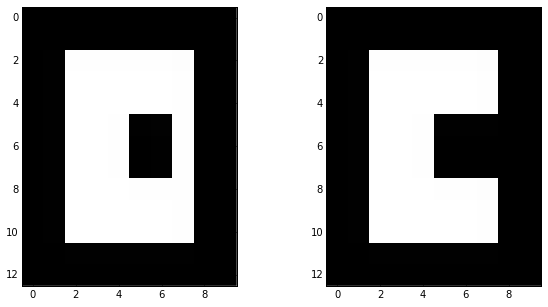

In [41]:
skdemo.imshow_all(image, morphology.opening(image, sq)) # erosion -> dilation

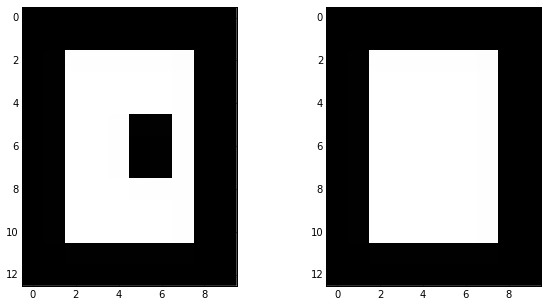

In [42]:
skdemo.imshow_all(image, morphology.closing(image, sq)) # dilation -> erosion

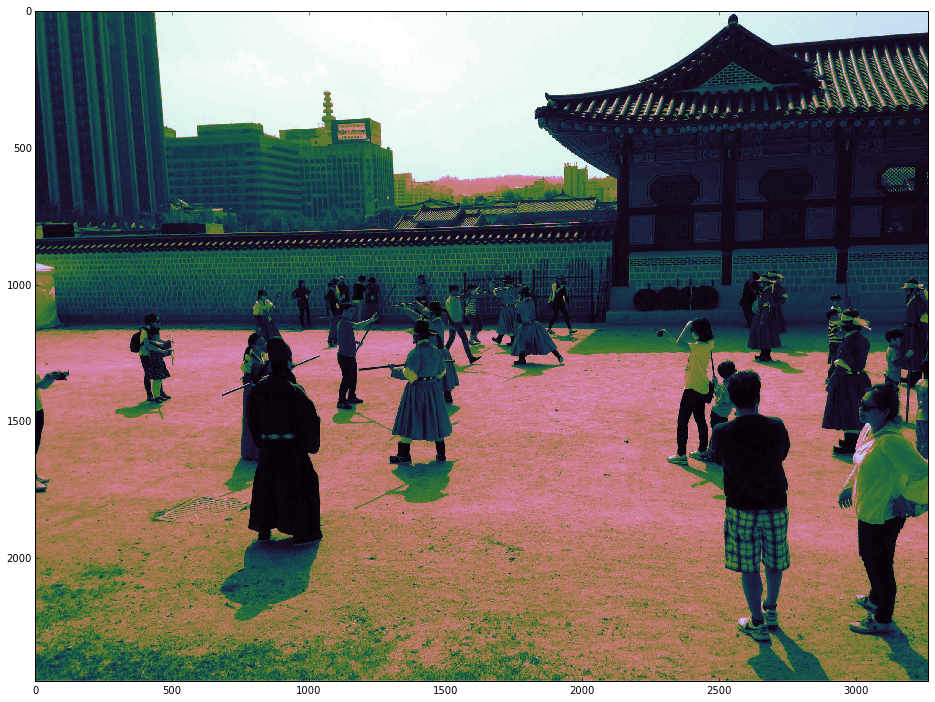

In [43]:
plt.figure(figsize=(16,12))

im = imread("./data/IMG_4158.jpg")
rgb = color.rgb2gray(im)
plt.imshow(rgb)

[[ 4  4  4 ...,  2  2  2]
 [ 4  4  4 ...,  2  2  2]
 [ 8  8  8 ...,  2  2  2]
 ..., 
 [ 9  9  9 ..., 11 11 11]
 [ 9  9  9 ..., 11 11 11]
 [ 9  9  9 ..., 11 11 11]]


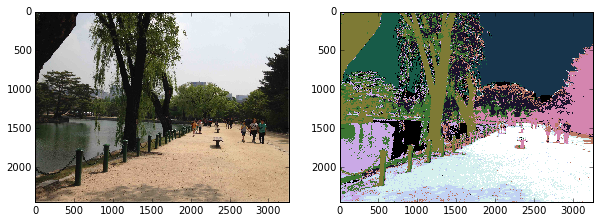

In [44]:
plt.figure(figsize=(16,12))

image = imread("./data/IMG_4139.jpg")
labels = seg.slic(image, n_segments=10, compactness=5)
skdemo.imshow_all(image, labels.astype(float) / labels.max())
print(labels)

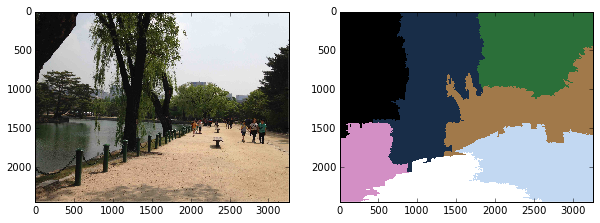

In [45]:
plt.figure(figsize=(16,12))

image = imread("./data/IMG_4139.jpg")
labels = seg.slic(image, n_segments=15, compactness=5, enforce_connectivity=True)
skdemo.imshow_all(image, labels.astype(float) / labels.max())

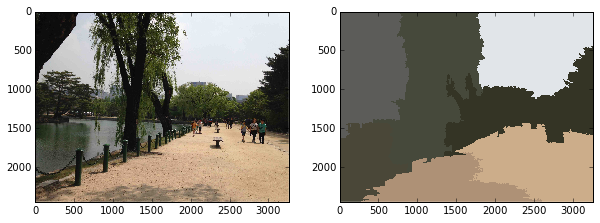

In [46]:
def mean_color(image, labels):
    out = np.zeros_like(image)
    for label in np.unique(labels):
        indices = np.nonzero(labels == label)
        out[indices] = np.mean(image[indices], axis=0)
    return out

image = imread("./data/IMG_4139.jpg")
skdemo.imshow_all(image, mean_color(image, labels))

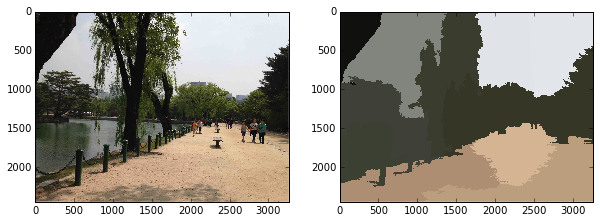

In [47]:
image = imread("./data/IMG_4139.jpg")
labels = seg.slic(image, n_segments=18, compactness=10,
                  enforce_connectivity=True)
label_image = mean_color(image, labels)
skdemo.imshow_all(image, label_image)

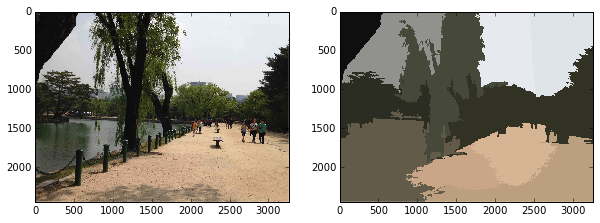

In [48]:
image = imread("./data/IMG_4139.jpg")
labels = seg.slic(image, n_segments=18, compactness=10,
                  sigma=2, enforce_connectivity=True)
label_image = mean_color(image, labels)
skdemo.imshow_all(image, label_image)

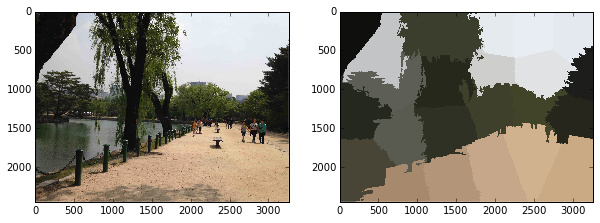

In [49]:
image = imread("./data/IMG_4139.jpg")
labels = seg.slic(image, n_segments=24, compactness=40,
                  sigma=2, enforce_connectivity=True)
label_image = mean_color(image, labels)
skdemo.imshow_all(image, label_image)

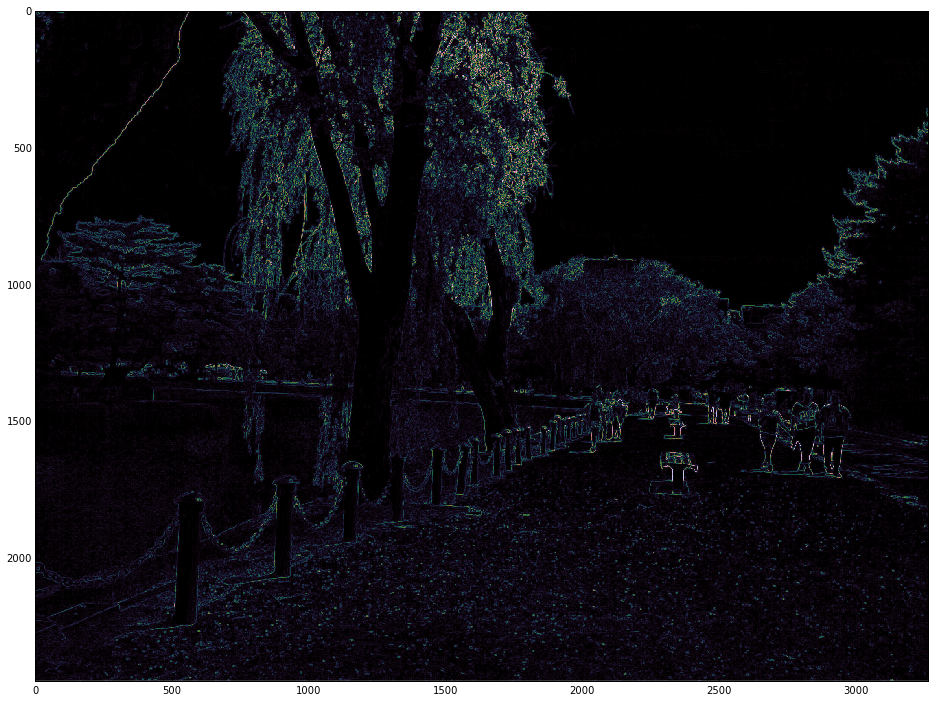

In [50]:
plt.figure(figsize=(16,12))
image = imread("./data/IMG_4139.jpg", as_grey=True)
edges = filters.sobel(image)
plt.imshow(edges)

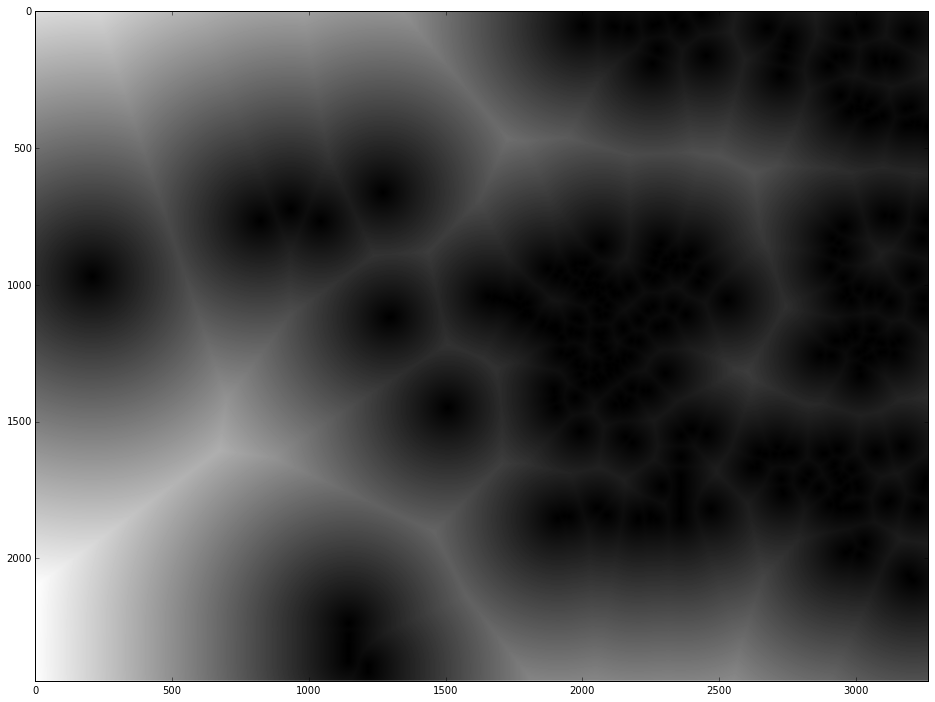

In [51]:
plt.figure(figsize=(16,12))
image = imread("./data/IMG_4142.jpg", as_grey=True)

edges = filters.sobel(image)
# Euclidean distance transform
# How far do we ave to travel from a non-edge to find an edge?
threshold = 0.4
non_edges = (edges < threshold)
distance_from_edge = nd.distance_transform_edt(non_edges)

plt.imshow(distance_from_edge, cmap='gray')

('Peaks shape:', (75, 2))


(-0.50, 3263.50, 2447.50, -0.50)

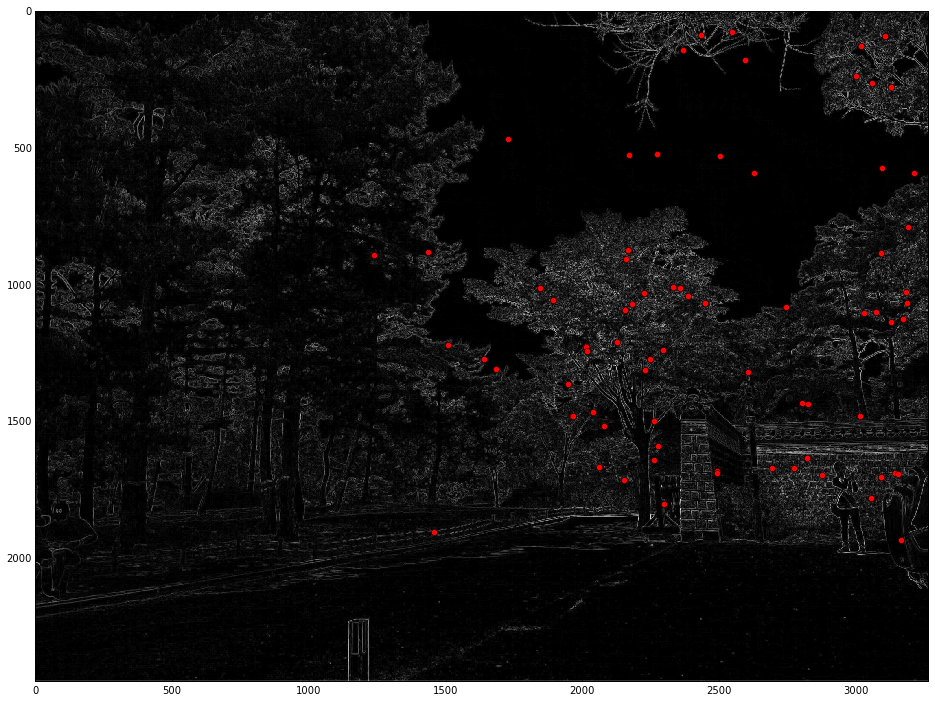

In [52]:
plt.figure(figsize=(16,12))
# -------------------------------------------------#
peaks = feature.peak_local_max(distance_from_edge)
print("Peaks shape:", peaks.shape)
# -------------------------------------------------#

peaks_image = np.zeros(image.shape, np.bool)
peaks_image[tuple(np.transpose(peaks))] = True
seeds, num_seeds = nd.label(peaks_image)

plt.imshow(edges, cmap='gray')
plt.plot(peaks[:, 1], peaks[:, 0], 'ro');
plt.axis('image')

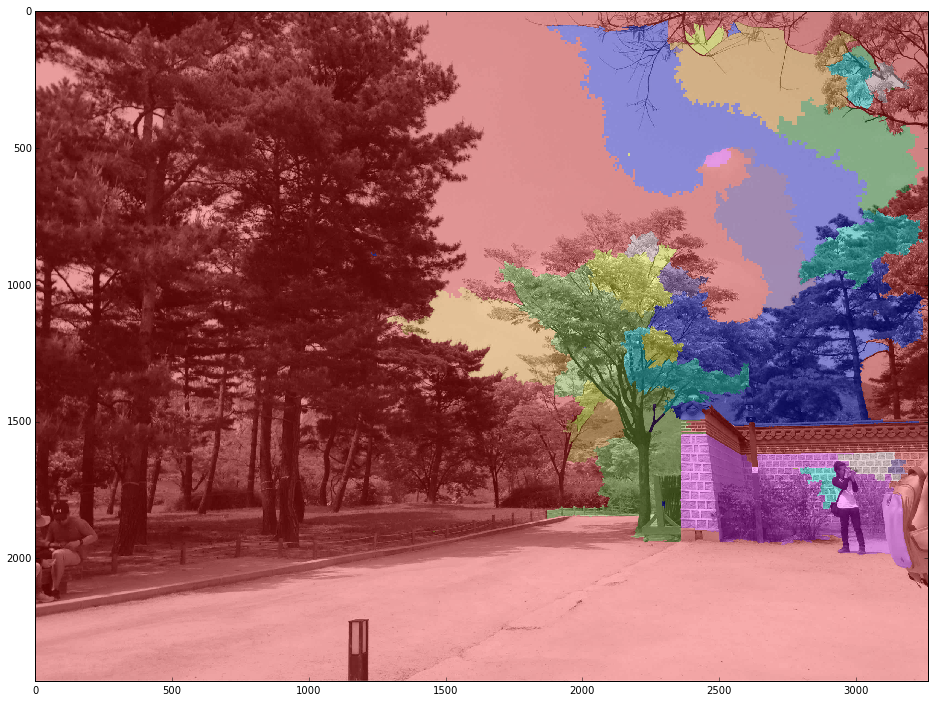

In [53]:
plt.figure(figsize=(16,12))
ws = watershed(edges, seeds)
plt.imshow(color.label2rgb(ws, image))

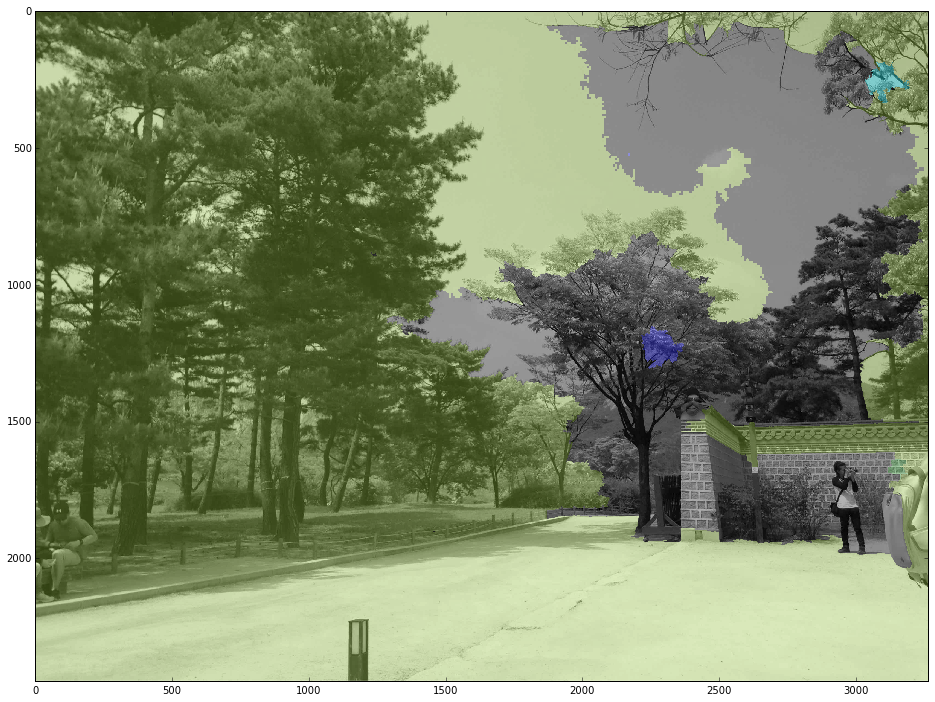

In [54]:
plt.figure(figsize=(16,12))

regions = regionprops(ws)

ws_updated = ws.copy()
for region in regions:
    if region.eccentricity > 0.6:
        ws_updated[ws_updated == region.label] = 0

plt.imshow(color.label2rgb(ws_updated, image, bg_label=0))

(<matplotlib.axes._subplots.AxesSubplot at 0x11a3daa50>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1546ad090>)

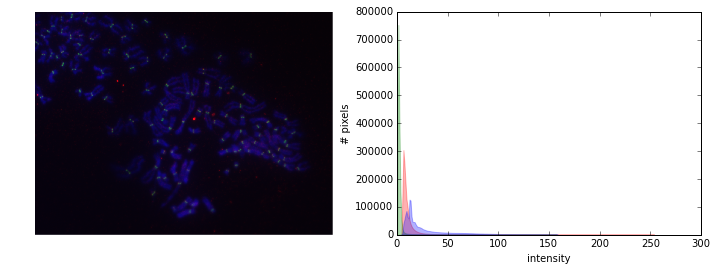

In [55]:
image = imread('./data/chromosomes.tif')
skdemo.imshow_with_histogram(image)

In [56]:
protein, centromeres, chromosomes = image.transpose((2, 0, 1))

In [57]:
print image.shape
print image.transpose().shape

(1040, 1388, 3)
(3, 1388, 1040)


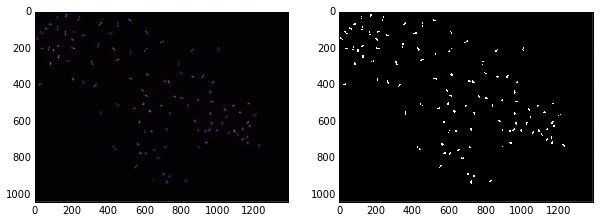

In [58]:
centromeres_binary = centromeres > threshold_otsu(centromeres)
skdemo.imshow_all(centromeres, centromeres_binary)

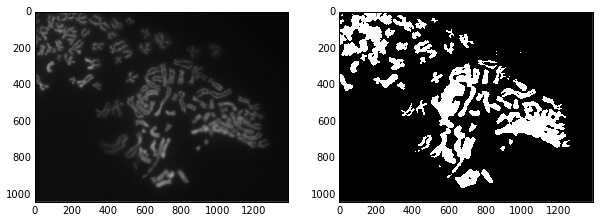

In [59]:
chromosomes_binary = chromosomes > threshold_otsu(chromosomes)
skdemo.imshow_all(chromosomes, chromosomes_binary, cmap='gray')

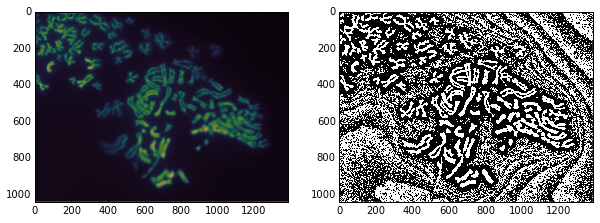

In [60]:
# Question: how did I choose this block size?
chromosomes_adapt = threshold_adaptive(chromosomes, block_size=51)
skdemo.imshow_all(chromosomes, chromosomes_adapt)

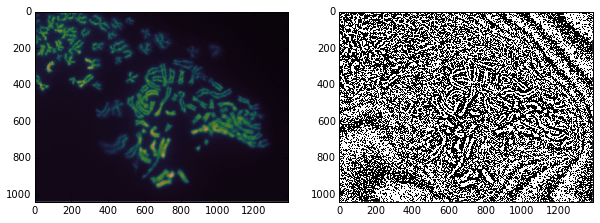

In [61]:
chromosomes_adapt = threshold_adaptive(chromosomes, block_size=15)
skdemo.imshow_all(chromosomes, chromosomes_adapt)

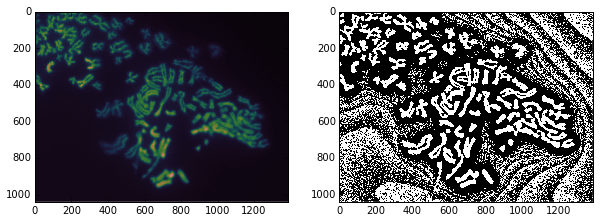

In [62]:
chromosomes_adapt = threshold_adaptive(chromosomes, block_size=100)
skdemo.imshow_all(chromosomes, chromosomes_adapt)

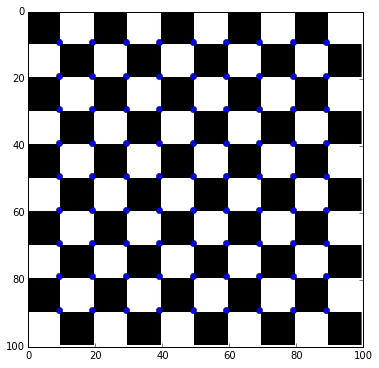

Number of corners: 81


In [63]:
# More pyplot!
def show_corners(corners,image,title=None):
    """Display a list of corners overlapping an image"""
    fig = plt.figure()
    plt.imshow(image)
    # Convert coordinates to x and y lists
    y_corner,x_corner = zip(*corners)
    plt.plot(x_corner,y_corner,'o') # Plot corners
    if title:
        plt.title(title)
    plt.xlim(0,image.shape[1])
    plt.ylim(image.shape[0],0) # Images use weird axes
    fig.set_size_inches(np.array(fig.get_size_inches()) * 1.5)
    plt.show()
    print "Number of corners:",len(corners)

# Make a checker board
checkers = np.zeros((100,100),dtype=np.bool)
ind = np.arange(100).reshape((10,10))[::2].flatten()
checkers[ind,:] = True
checkers[:,ind] = np.invert(checkers[:,ind])
checkers = np.where(checkers,1.,0.)

# Run Harris
checkers_corners = corner_peaks(corner_harris(checkers),min_distance=2)
show_corners(checkers_corners,checkers)

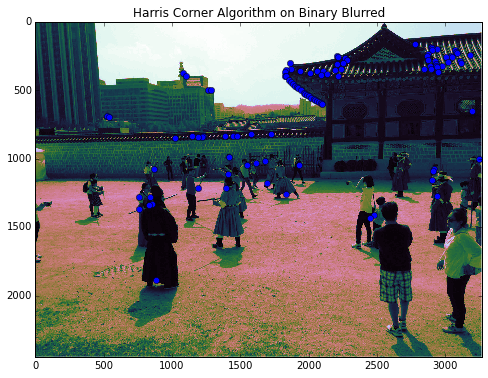

Number of corners: 107


In [64]:
plt.figure(figsize=(16,12))

im = imread("./data/IMG_4158.jpg", as_grey=True)

blurred_corners = corner_peaks(corner_harris(im), min_distance=7)
show_corners(blurred_corners, im,
             title="Harris Corner Algorithm on Binary Blurred")

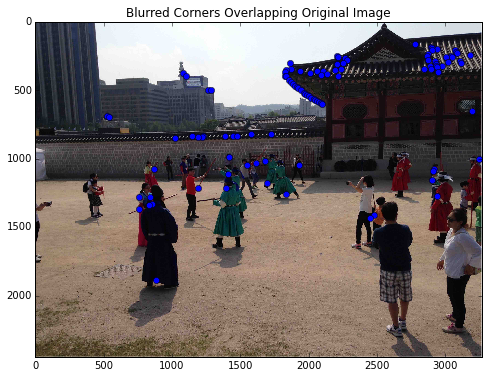

Number of corners: 107


In [65]:
im = imread("./data/IMG_4158.jpg", as_grey=False)
show_corners(blurred_corners, im,
             title="Blurred Corners Overlapping Original Image")

In [66]:
def show_images(images,titles=None):
    """Display a list of images"""
    n_ims = len(images)
    if titles is None: titles = ['(%d)' % i for i in range(1,n_ims + 1)]
    fig = plt.figure()
    n = 1
    for image,title in zip(images,titles):
        a = fig.add_subplot(1,n_ims,n) # Make subplot
        if image.ndim == 2: # Is image grayscale?
            plt.gray() # Only place in this blog you can't replace 'gray' with 'grey'
        plt.imshow(image)
        a.set_title(title)
        n += 1
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_ims)
    plt.show()

/Users/dikien/anaconda/lib/python2.7/site-packages/skimage/filters/edges.py:173: skimage_deprecation: Call to deprecated function ``hsobel``. Use ``skimage.filters.sobel_h`` instead.
  def hsobel(image, mask=None):
/Users/dikien/anaconda/lib/python2.7/site-packages/skimage/filters/edges.py:204: skimage_deprecation: Call to deprecated function ``vsobel``. Use ``skimage.filters.sobel_v`` instead.
  def vsobel(image, mask=None):


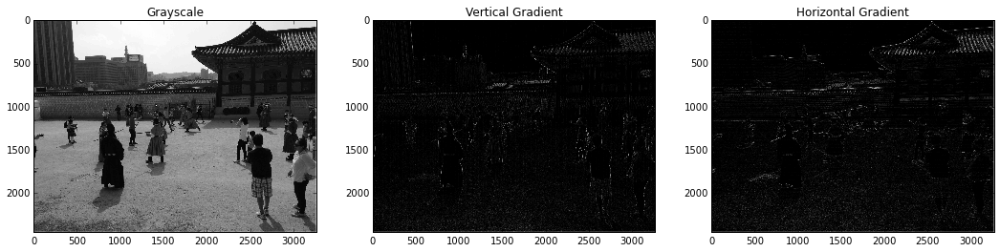

In [67]:
gray_image = imread("./data/IMG_4158.jpg", as_grey=True)
h_gradient = hsobel(gray_image)
v_gradient = vsobel(gray_image)

show_images(images=[gray_image,v_gradient,h_gradient],
            titles=["Grayscale","Vertical Gradient","Horizontal Gradient"])

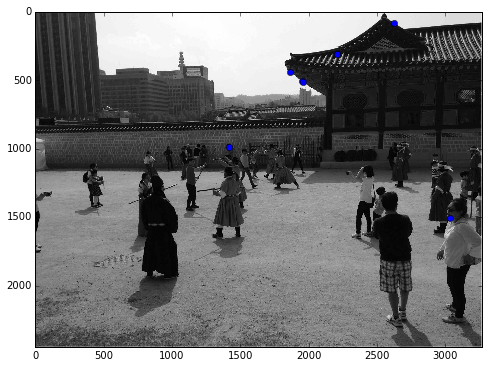

Number of corners: 7


In [68]:
top_n = 4000
# Take coordinates of top n "largest" derivative values from each image
h_large = zip(*np.where(h_gradient > np.sort(h_gradient.flatten())[-top_n]))
v_large = zip(*np.where(v_gradient > np.sort(v_gradient.flatten())[-top_n]))

# Intersection of coordinates
estimated_corners = list(set(h_large) & set(v_large))

show_corners(estimated_corners, gray_image)

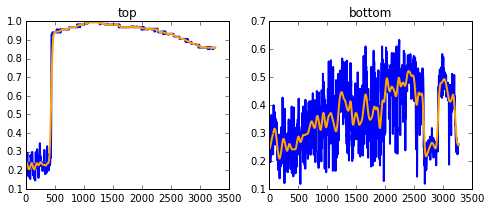

In [73]:
image = imread("./data/IMG_4158.jpg", as_grey=True)

top, bottom = image[[0, -1], :]

fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, figsize=(8, 3))

top_smooth = nd.gaussian_filter1d(top, sigma=20)
ax0.plot(top, color='blue', lw=2)
ax0.plot(top_smooth, color='orange', lw=2)
ax0.set_title('top')

bottom_smooth = nd.gaussian_filter1d(bottom, sigma=20)
ax1.plot(bottom, color='blue', lw=2)
ax1.plot(bottom_smooth, color='orange', lw=2)
ax1.set_title('bottom')

In [74]:
top_mode = top_smooth.argmax()
top_max = top_smooth[top_mode]
top_width = (top_smooth > float(top_max) / 2).sum()

bottom_mode = bottom_smooth.argmax()
bottom_max = bottom_smooth[bottom_mode]
bottom_width = (bottom_smooth > float(bottom_max) / 2).sum()

width = max(bottom_width, top_width)

print(top_mode, top_width, bottom_mode, bottom_width)

(1152, 2835, 2403, 2765)


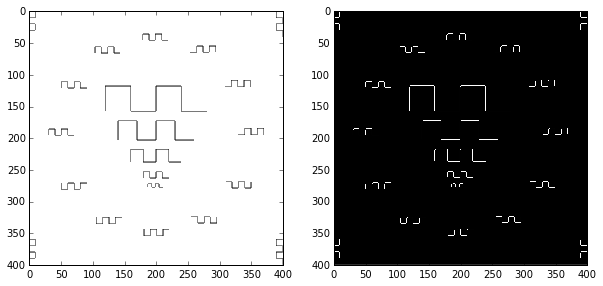

In [76]:
img = imread("./data/snakes.png", as_grey=True)

# Reduce all lines to one pixel thickness
snakes = morphology.skeletonize(img < 1)

skdemo.imshow_all(img, snakes)

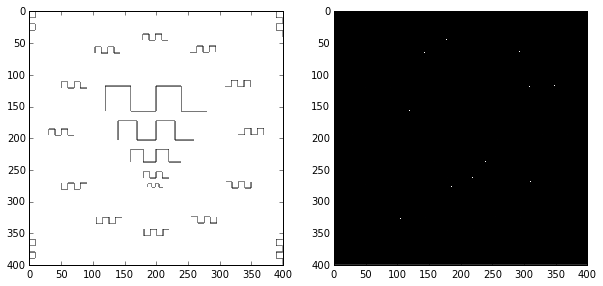

In [80]:
img = imread("./data/snakes.png", as_grey=True)


# Reduce all lines to one pixel thickness
snakes = morphology.skeletonize(img < 1)

# Find pixels with only one neighbor
corners = convolve2d(snakes, [[1, 1, 1],
                              [1, 0, 1],
                              [1, 1, 1]], mode='same') == 1

corners = corners & snakes

skdemo.imshow_all(img, corners)

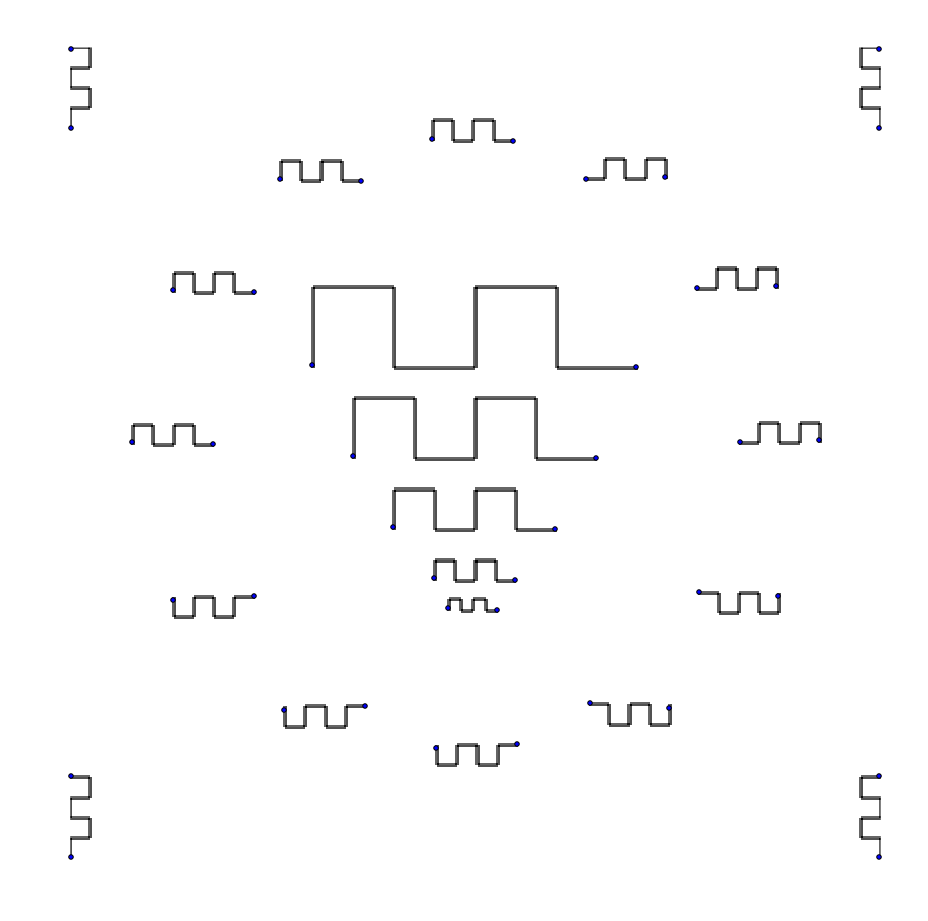

In [82]:
# Those are the start and end positions of the segments
y, x = np.where(corners)

plt.figure(figsize=(18, 16))
plt.imshow(img, cmap=plt.cm.gray, interpolation='nearest')
plt.scatter(x, y)
plt.axis('off')
plt.show()

/Users/dikien/anaconda/lib/python2.7/site-packages/skimage/filters/__init__.py:27: skimage_deprecation: Call to deprecated function ``canny``. Use ``skimage.feature.canny`` instead.
  def canny(*args, **kwargs):


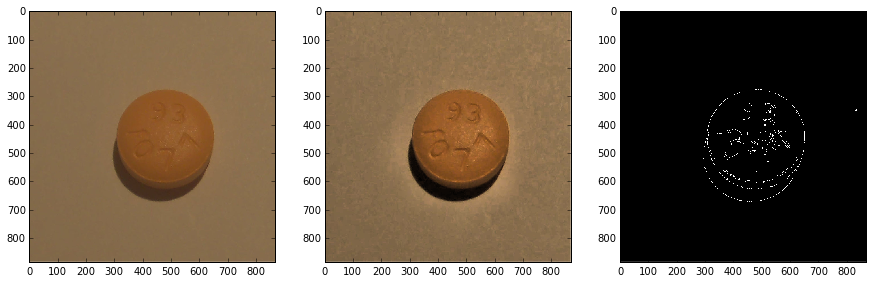

In [83]:
image = io.imread("./data/round_pill.jpg")
image_equalized = exposure.equalize_adapthist(image)
edges = filters.canny(color.rgb2gray(image_equalized))

f, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(15, 8))
ax0.imshow(image)
ax1.imshow(image_equalized)
ax2.imshow(edges, cmap='gray')

('Circle parameters:', array([ 451.83,  481.08,  175.22]))


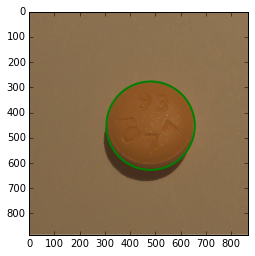

In [86]:
coords = np.column_stack(np.nonzero(edges))

model, inliers = measure.ransac(coords, measure.CircleModel,
                                min_samples=3, residual_threshold=1,
                                max_trials=500)

print('Circle parameters:', model.params)

row, col, radius = model.params

f, ax = plt.subplots()
ax.imshow(image, cmap='gray')
circle = plt.Circle((col, row), radius=radius, edgecolor='green', linewidth=2, fill=False)
ax.add_artist(circle)

In [96]:
print edges
print edges.shape
print 
print np.nonzero(edges)
print len(np.nonzero(edges)[0])
print len(np.nonzero(edges))
print 
print np.column_stack(np.nonzero(edges)).shape

[[False False False ..., False False False]
 [False False False ..., False False False]
 [False False False ..., False False False]
 ..., 
 [False False False ..., False False False]
 [False False False ..., False False False]
 [False False False ..., False False False]]
(885, 869)

(array([273, 273, 274, ..., 672, 672, 672]), array([497, 498, 489, ..., 459, 464, 465]))
4683
2

(4683, 2)


/Users/dikien/anaconda/lib/python2.7/site-packages/skimage/filters/__init__.py:27: skimage_deprecation: Call to deprecated function ``canny``. Use ``skimage.feature.canny`` instead.
  def canny(*args, **kwargs):


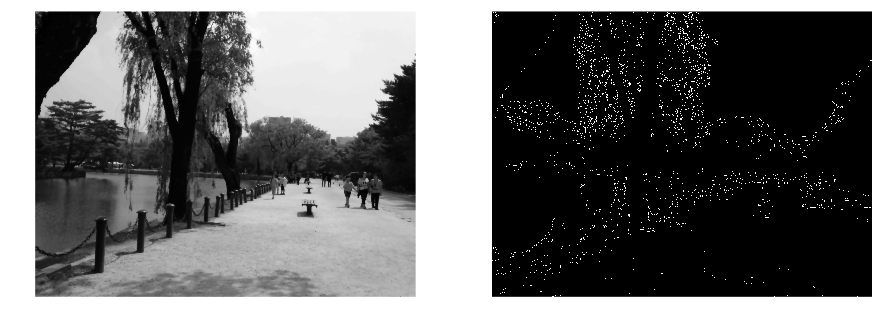

In [102]:
image = io.imread("./data/IMG_4139.jpg", as_grey=True)
denoised = skimage.restoration.denoise_tv_bregman(image, 1)
edges = filters.canny(denoised, low_threshold=0.01, high_threshold=0.21)

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
axes[0].imshow(denoised, cmap='gray')
axes[1].imshow(edges, cmap='gray')
for ax in axes:
    ax.set_axis_off()

('Number of coins:', 24)


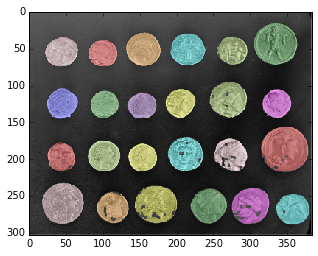

In [104]:
image = data.coins()
equalized = exposure.equalize_adapthist(image)
edges = equalized > filters.threshold_otsu(equalized)
edges = segmentation.clear_border(edges)
edges = morphology.closing(edges, morphology.square(3))

labels = measure.label(edges)
for region in measure.regionprops(labels):
    if region.area < 200:
        rows, cols = region.coords.T
        labels[rows, cols] = 0

print("Number of coins:", len(np.unique(labels)) - 1)
        
out = color.label2rgb(labels, image, bg_label=0)
plt.imshow(out)

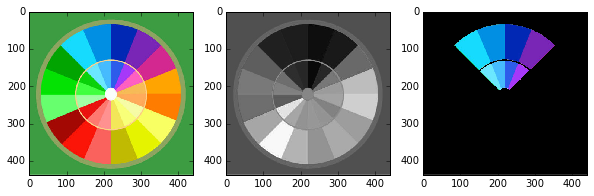

In [105]:
image = img_as_float(imread('./data/color-wheel.jpg'))

blue_lab = color.rgb2lab([[[0, 0, 1.]]])
light_blue_lab = color.rgb2lab([[[0, 1, 1.]]])
red_lab = color.rgb2lab([[[1, 0, 0.]]])
image_lab = color.rgb2lab(image)

distance_blue = color.deltaE_cmc(blue_lab, image_lab, kL=0.5, kC=0.5)
distance_light_blue = color.deltaE_cmc(light_blue_lab, image_lab, kL=0.5, kC=0.5)
distance_red = color.deltaE_cmc(red_lab, image_lab, kL=0.5, kC=0.5)
distance = distance_blue + distance_light_blue - distance_red
distance = exposure.rescale_intensity(distance)

image_blue = image.copy()
image_blue[distance > 0.3] = 0

f, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(10, 5))
ax0.imshow(image)
ax1.imshow(distance, cmap='gray')
ax2.imshow(image_blue)
plt.show()

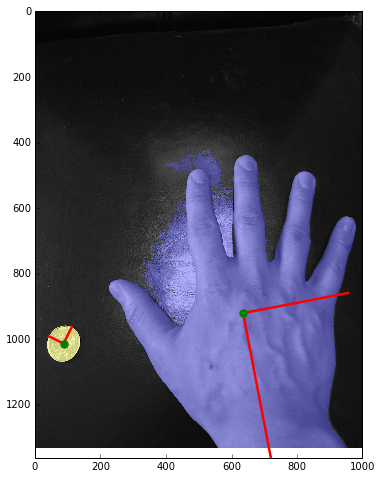

In [106]:
image = imread("./data/hand-coin.jpg")

label_image = segmentation.slic(image, n_segments=2)
label_image = measure.label(label_image)

regions = measure.regionprops(label_image)
areas = [r.area for r in regions]
ix = np.argsort(areas)

hand = regions[ix[-1]]
coin = regions[ix[-2]]

selected_labels = np.zeros_like(image[..., 0], dtype=np.uint8)

fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(8, 8))

for n, region in enumerate([hand, coin]):
    selected_labels[region.coords[:, 0], region.coords[:, 1]] = n + 2

    y0, x0 = region.centroid
    orientation = region.orientation

    x1 = x0 + np.cos(orientation) * 0.5 * region.major_axis_length
    y1 = y0 - np.sin(orientation) * 0.5 * region.major_axis_length
    x2 = x0 - np.sin(orientation) * 0.5 * region.minor_axis_length
    y2 = y0 - np.cos(orientation) * 0.5 * region.minor_axis_length

    ax.plot((x0, x1), (y0, y1), '-r', linewidth=2.5)
    ax.plot((x0, x2), (y0, y2), '-r', linewidth=2.5)
    ax.plot(x0, y0, '.g', markersize=15)

image_label_overlay = color.label2rgb(selected_labels, image=image, bg_label=0)
ax.imshow(image_label_overlay, cmap='gray')
ax.axis('image')
plt.show()

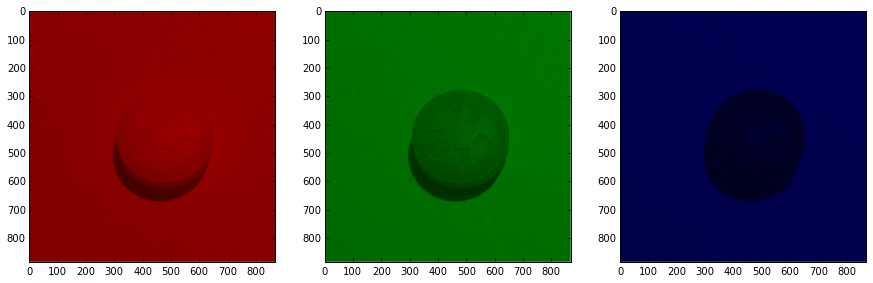

In [107]:
color_image = io.imread("./data/round_pill.jpg")

red_image = np.zeros_like(color_image)
green_image = np.zeros_like(color_image)
blue_image = np.zeros_like(color_image)

r, g, b = np.rollaxis(color_image, axis=-1)
red_image[:, :, 0] = r
green_image[:, :, 1] = g
blue_image[:, :, 2] = b

skdemo.imshow_all(red_image, green_image, blue_image)

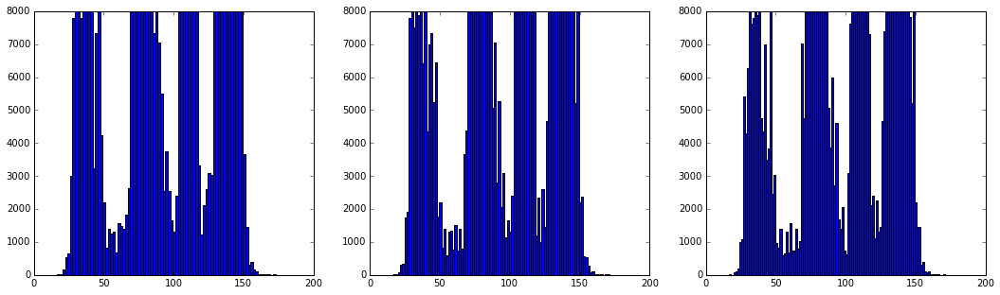

In [108]:
fig, axes = plt.subplots(ncols=3, figsize=(18, 5))

for ax, bins in zip(axes, (100, 115, 130)):
    ax.hist(color_image.flatten(), bins=bins);
    ax.set_ylim(ymax=8000)

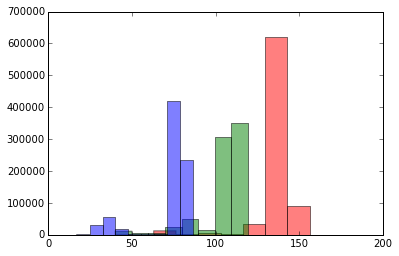

In [109]:
for color, channel in zip('rgb', np.rollaxis(color_image, axis=-1)):
    plt.hist(channel.flatten(), color=color, alpha=0.5)

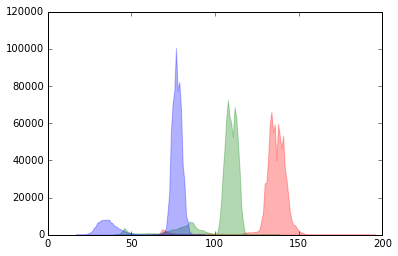

In [110]:
for color, channel in zip('rgb', np.rollaxis(color_image, axis=-1)):
    hist, bin_centers = exposure.histogram(channel)
    plt.fill_between(bin_centers, hist, color=color, alpha=0.3)

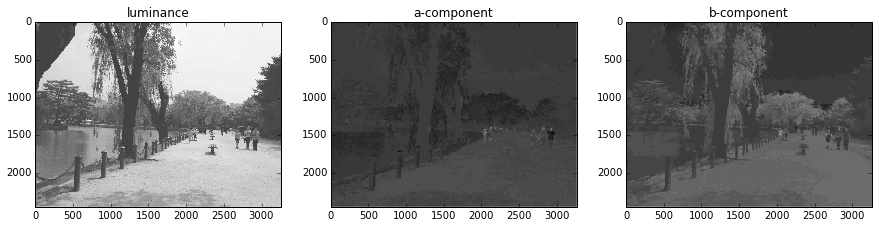

In [112]:
color_image = io.imread("./data/IMG_4139.jpg", as_grey=False)

lab_image = skimage.color.rgb2lab(color_image)
luminance, a, b = np.rollaxis(lab_image, axis=-1)
titles = ['luminance', 'a-component', 'b-component']
skdemo.imshow_all(luminance, a, b, titles=titles)

/Users/dikien/anaconda/lib/python2.7/site-packages/skimage/filters/__init__.py:27: skimage_deprecation: Call to deprecated function ``canny``. Use ``skimage.feature.canny`` instead.
  def canny(*args, **kwargs):


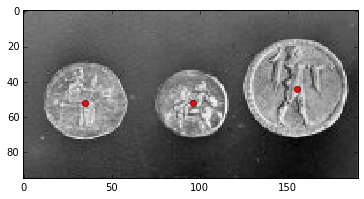

In [116]:
image = data.coins()[0:95, 180:370]
edges = filters.canny(image, sigma=3, low_threshold=10, high_threshold=60)
hough_radii = np.arange(15, 30, 2)
hough_response = hough_circle(edges, hough_radii)

centers = []
likelihood = []

for h in hough_response:
    peaks = peak_local_max(h)
    centers.extend(peaks)
    likelihood.extend(h[peaks[:, 0], peaks[:, 1]])

for i in np.argsort(likelihood)[-3:]:
    row, column = centers[i]
    plt.plot(column, row, 'ro')
    plt.imshow(image)

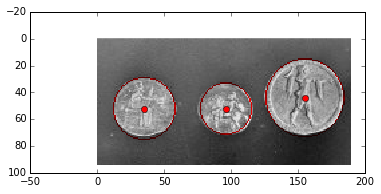

In [121]:
radii = []
centers = []
likelihood = []
for h, r in zip(hough_response, hough_radii):
    peaks = peak_local_max(h)
    radii.extend([r] * len(peaks))
    centers.extend(peaks)
    likelihood.extend(h[peaks[:, 0], peaks[:, 1]])
    
drawn_image = gray2rgb(image)
plt.imshow(drawn_image)
for i in np.argsort(likelihood)[-3:]:
    row, column = centers[i]
    rr, cc = circle_perimeter(row, column, radii[i])
    drawn_image[rr, cc, 1:] = 0
    plt.plot(column, row, 'ro')

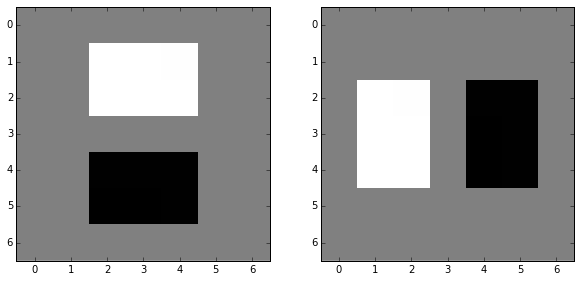

In [123]:
bright_square = np.zeros((7, 7), dtype=float)
bright_square[2:5, 2:5] = 1

horizontal_edge_kernel = np.array([[1], [0], [-1]])
vertical_edge_kernel = np.array([[1, 0, -1]])

image = bright_square
horizontal_edges = convolve(image, horizontal_edge_kernel)
vertical_edges = convolve(image, vertical_edge_kernel)
skdemo.imshow_all(horizontal_edges, vertical_edges)

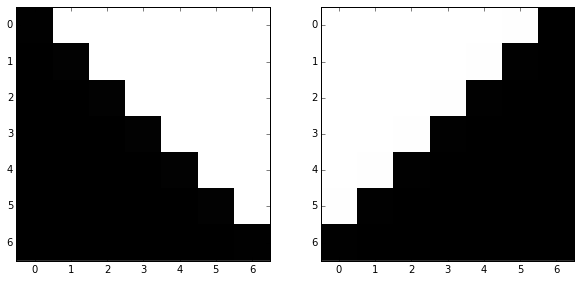

In [124]:
# Kernel copied from `vsobel` docstring.
# Vertical edge-reponse is the *horizontal* gradient.
dx_kernel = np.array([
    [1,   0,  -1],
    [2,   0,  -2],
    [1,   0,  -1],
])
# Rotate array by 90 degrees to get y-gradient kernel
dy_kernel = np.rot90(dx_kernel)

image_45 = np.tril(-np.ones([7, 7]))
image_135 = np.rot90(image_45)
skdemo.imshow_all(image_45, image_135)

In [125]:
def angle_image(image):
    image = img_as_float(image)
    dy = convolve(image, dy_kernel)
    dx = convolve(image, dx_kernel)

    angle = np.arctan2(dy, dx)
    return np.degrees(angle)

In [126]:
%precision 0
print angle_image(image_45)
print 
print angle_image(image_135)

[[ 18.  27.  45.   0.   0.   0.   0.]
 [ 45.  45.  45.  45.   0.   0.   0.]
 [  0.  45.  45.  45.  45.   0.   0.]
 [  0.   0.  45.  45.  45.  45.   0.]
 [  0.   0.   0.  45.  45.  45.  45.]
 [  0.   0.   0.   0.  45.  45.  63.]
 [  0.   0.   0.   0.   0.  45.  72.]]

[[   0.    0.    0.    0.  135.  153.  162.]
 [   0.    0.    0.  135.  135.  135.  135.]
 [   0.    0.  135.  135.  135.  135.    0.]
 [   0.  135.  135.  135.  135.    0.    0.]
 [ 135.  135.  135.  135.    0.    0.    0.]
 [ 117.  135.  135.    0.    0.    0.    0.]
 [ 108.  135.    0.    0.    0.    0.    0.]]


In [130]:
ic = io.ImageCollection('./data/pano/*.jpg')
print ic.files

['./data/pano/DFM_4209.jpg', './data/pano/DFM_4210.jpg', './data/pano/DFM_4211.jpg']


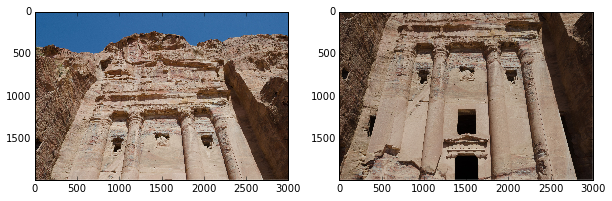

In [132]:
skdemo.imshow_all(ic[0], ic[1])

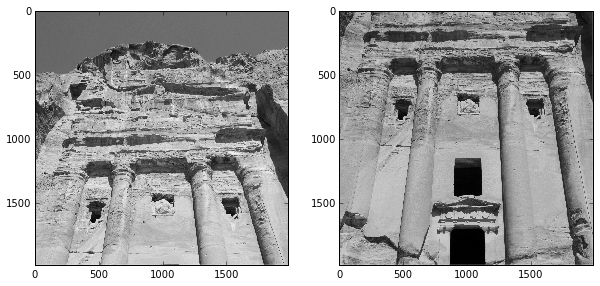

In [135]:
image0 = color.rgb2gray(ic[0][:, 500:500+1987, :])
image1 = color.rgb2gray(ic[1][:, 500:500+1987, :])
skdemo.imshow_all(image0, image1)

the dimension of rescale is (124, 124)


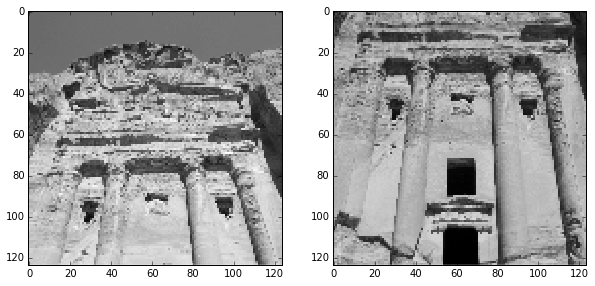

In [138]:
image0 = skimage.transform.rescale(image0, 0.25)
image1 = skimage.transform.rescale(image1, 0.25)
print "the dimension of rescale is %s" % str(image0.shape)
skdemo.imshow_all(image0, image1)

In [140]:
orb = ORB(n_keypoints=1000, fast_threshold=0.05)

In [145]:
orb.detect_and_extract(image0)
keypoints1 = orb.keypoints
descriptors1 = orb.descriptors

orb.detect_and_extract(image1)
keypoints2 = orb.keypoints
descriptors2 = orb.descriptors

In [144]:
print keypoints1.shape
print descriptors1.shape

(1000, 2)
(1000, 256)


In [146]:
matches12 = match_descriptors(descriptors1, descriptors2, cross_check=True)

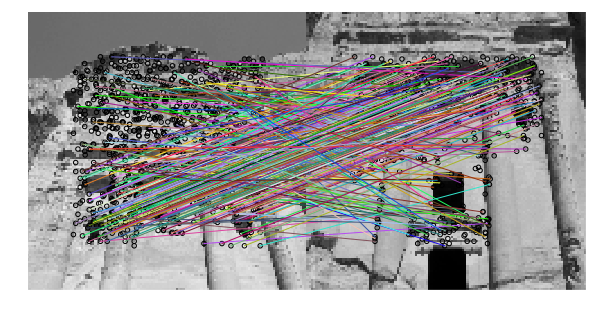

In [147]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
feature.plot_matches(ax, image0, image1, keypoints1, keypoints2, matches12)
ax.axis('off')

(0, 248, 124, 0)

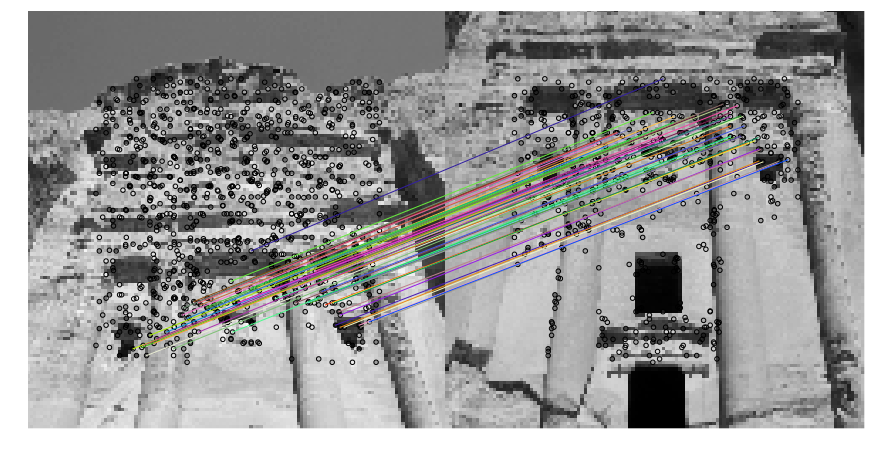

In [151]:
# Select keypoints from the source (image to be registered)
# and target (reference image)
src = keypoints2[matches12[:, 1]][:, ::-1]
dst = keypoints1[matches12[:, 0]][:, ::-1]

model_robust, inliers = ransac((src, dst), ProjectiveTransform,
                               min_samples=4, residual_threshold=2)

fig, ax = plt.subplots(1, 1, figsize=(15, 15))
plot_matches(ax, image0, image1, keypoints1, keypoints2, matches12[inliers])
ax.axis('off')

In [154]:
def add_alpha(image, background=-1):
    """Add an alpha layer to the image.
    The alpha layer is set to 1 for foreground and 0 for background.
    """
    return np.dstack((gray2rgb(image), (image != background)))

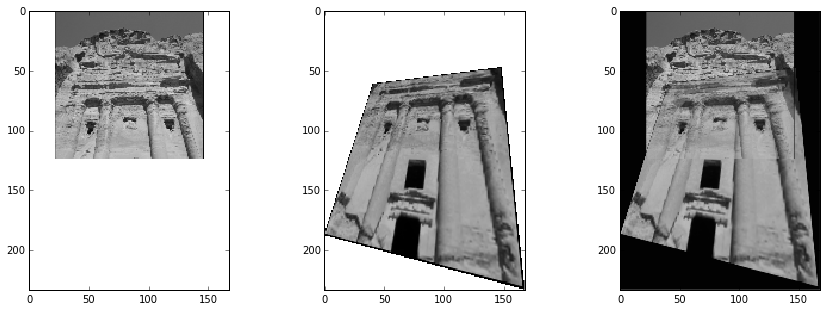

In [156]:
# Note that transformations take coordinates in (x, y) format,
# not (row, column), in order to be consistent with most literature
r, c = image1.shape[:2]

corners = np.array([[0, 0],
                    [0, r],
                    [c, 0],
                    [c, r]])

# Warp the image corners to their new positions
warped_corners = model_robust(corners)

# Find the extents of both the reference image and the warped
# target image
all_corners = np.vstack((warped_corners, corners))

corner_min = np.min(all_corners, axis=0)
corner_max = np.max(all_corners, axis=0)

output_shape = (corner_max - corner_min)
output_shape = np.ceil(output_shape[::-1])

offset = SimilarityTransform(translation=-corner_min)

image0_ = warp(image0, offset.inverse,
               output_shape=output_shape, cval=-1)

image1_ = warp(image1, (model_robust + offset).inverse,
               output_shape=output_shape, cval=-1)

image0_alpha = add_alpha(image0_)
image1_alpha = add_alpha(image1_)

merged = (image0_alpha + image1_alpha)
alpha = merged[..., 3]

# The summed alpha layers give us an indication of how many
# images were combined to make up each pixel.  Divide by the
# number of images to get an average.
merged /= np.maximum(alpha, 1)[..., np.newaxis]
merged = merged[..., :3]

skdemo.imshow_all(image0_alpha, image1_alpha, merged)

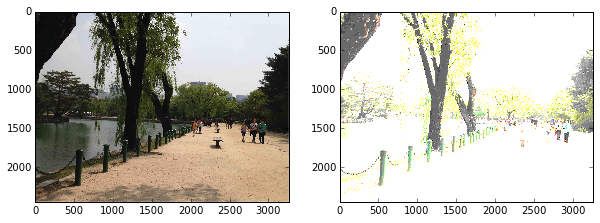

In [170]:
# Rescale histogram for better display
image = imread("./data/IMG_4139.jpg")
# image_gray = imread("./data/IMG_4139.jpg", as_grey=True)

# fd, hog_image = feature.hog(image_gray, orientations=8, pixels_per_cell=(16, 16),
#                     cells_per_block=(1, 1), visualise=False)

image_rescaled = exposure.rescale_intensity(image, in_range=(0, 2**5 - 1))

skdemo.imshow_all(image, image_rescaled)

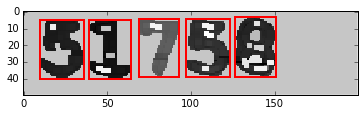

In [193]:
im = imread('./data/simpleCaptcha.skt.4.png')
w, h, _ = im.shape

for x in range(w):
    for j in range(h):
        if im[x][j][0] == im[x][j][1] and im[x][j][1] == im[x][j][2] and im[x][j][2] == im[x][j][0]:
            im[x][j][0] = 255
            im[x][j][1] = 255
            im[x][j][2] = 255
            
im_gray = color.rgb2gray(im)
im_gray = skimage.img_as_ubyte(im_gray)
im_gray = morphology.opening(im_gray, morphology.square(3))
im_gray_equalize = exposure.equalize_hist(im_gray)
image = im_gray_equalize            
            
# apply threshold
thresh = threshold_otsu(image)
threshold = filters.threshold_otsu(im_gray_equalize).copy()
threshold = im_gray_equalize < threshold
threshold = img_as_ubyte(threshold)
bw = threshold

# # remove artifacts connected to image border
cleared = bw.copy()
segmentation.clear_border(cleared)

# # label image regions
label_image = measure.label(cleared)
borders = np.logical_xor(bw, cleared)
label_image[borders] = -1
image_label_overlay = color.label2rgb(label_image, image=image)
image_label_overlay = color.rgb2gray(image_label_overlay)

fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(6, 6))
ax.imshow(image_label_overlay)

for region in regionprops(label_image):
    
#     # skip small images
    if region.area < 300:
        continue
    
    # draw rectangle around digits
    minr, minc, maxr, maxc = region.bbox
    rect = mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr,
                                  fill=False, edgecolor='red', linewidth=2)
    ax.add_patch(rect)

In [182]:
label_image.shape

(50, 200)

In [194]:
print regionprops(label_image)[0].area
print regionprops(label_image)[0].bbox
minr, minc, maxr, maxc = region.bbox
print minr, minc, maxr, maxc
print mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr, fill=False, edgecolor='red', linewidth=2)
print 
print regionprops(label_image)[1].area
print regionprops(label_image)[1].bbox
minr, minc, maxr, maxc = region.bbox
print minr, minc, maxr, maxc
print mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr, fill=False, edgecolor='red', linewidth=2)
print 
print regionprops(label_image)[2].area
print regionprops(label_image)[2].bbox
minr, minc, maxr, maxc = region.bbox
print minr, minc, maxr, maxc
print mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr, fill=False, edgecolor='red', linewidth=2)
print 
print regionprops(label_image)[3].area
print regionprops(label_image)[3].bbox
minr, minc, maxr, maxc = region.bbox
print minr, minc, maxr, maxc
print mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr, fill=False, edgecolor='red', linewidth=2)
print 

537.0
(3L, 126L, 39L, 151L)
33 107 36 111
Rectangle(107,33;4x3)

389.0
(4L, 69L, 39L, 93L)
33 107 36 111
Rectangle(107,33;4x3)

545.0
(4L, 97L, 39L, 123L)
33 107 36 111
Rectangle(107,33;4x3)

554.0
(5L, 10L, 40L, 36L)
33 107 36 111
Rectangle(107,33;4x3)



In [157]:
# 부족한 부분
# 잘린 두개의 이미지 합성
# 이미지를 영역별로 나눠서 표시하는거
# hog로 parameter를 바꿔서 테스트